# Credit Cart Customer Clustering

### Import Libraries & Dataset

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio


import warnings
warnings.filterwarnings('ignore')

# Import requirement libraries and tools for modeling
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans, MiniBatchKMeans, MeanShift, estimate_bandwidth, AffinityPropagation, Birch, DBSCAN, OPTICS, AgglomerativeClustering 
from yellowbrick.cluster import KElbowVisualizer
import scipy.cluster.hierarchy as sch
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.model_selection import GridSearchCV
from sklearn import set_config
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.decomposition import PCA
from itertools import product
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE

In [51]:
df = pd.read_csv(r"C:\Users\akash\OneDrive\Documents\dataset\kaggle dataset\CreditCard_customer_dataset.zip")
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


### Overview of Dataset

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

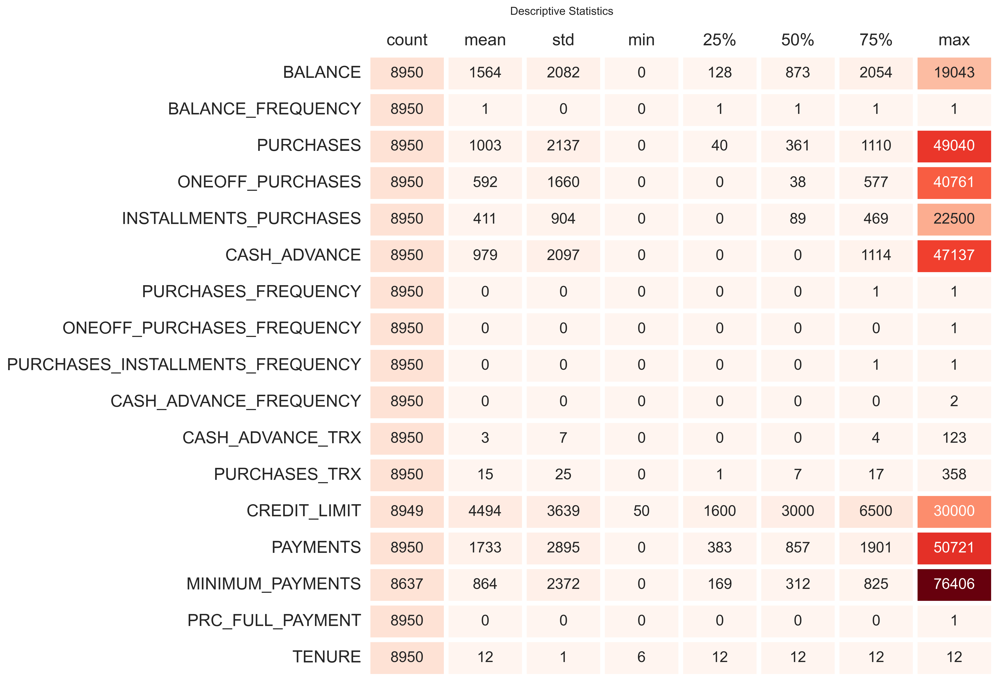

In [53]:
desc_cust = df.select_dtypes(include=['int64','float64']).describe().T
desc_cust_df = pd.DataFrame(index=desc_cust.index, columns=desc_cust.columns, data=desc_cust )

f,ax = plt.subplots(figsize=(12,12),dpi=500)

sns.heatmap(desc_cust_df, annot=True,cmap = "Reds", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,
            annot_kws={"size": 16})

ax.xaxis.set_ticks_position('top')
plt.tick_params(left=False, top=False)
plt.xticks(size = 18)
plt.yticks(size = 18)
plt.title("Descriptive Statistics", pad=30, x=0.31, y=1.02)
plt.show()

### Cleaning Dataset

In [54]:
# Drop the cust_id columns because we do not neet it
df = df.drop('CUST_ID', axis=1)

In [55]:
def highlight_cells(val):
    """Highlight cells that is not zero"""
    f_color = '#D1382F' if val != 0 else ''  # Red
    bg_color = '#D59A99' if val != 0 else ''   # Pink
    w_font = 'bold'
    return 'background-color: {}; color: {}; font-weight: {}'.format(bg_color, f_color, w_font)

# Check missing values
is_nan = df.isna().sum().to_frame(name='Number_of_NaN')
is_nan.insert(1,'Percent(%)', [round(x/df.shape[0]*100,2) for x in is_nan.Number_of_NaN])
is_nan.style.applymap(highlight_cells)

,Number_of_NaN,Percent(%)
BALANCE,0,0.000000
BALANCE_FREQUENCY,0,0.000000
PURCHASES,0,0.000000
ONEOFF_PURCHASES,0,0.000000
INSTALLMENTS_PURCHASES,0,0.000000
CASH_ADVANCE,0,0.000000
PURCHASES_FREQUENCY,0,0.000000
ONEOFF_PURCHASES_FREQUENCY,0,0.000000
PURCHASES_INSTALLMENTS_FREQUENCY,0,0.000000
CASH_ADVANCE_FREQUENCY,0,0.000000


In [56]:
# Overview nan value in credit_limit column
df[df['CREDIT_LIMIT'].isna()]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


In [57]:
# Drop row with nan value in credit_limit
df = df.drop(df[df.CREDIT_LIMIT.isna()].index, axis=0)

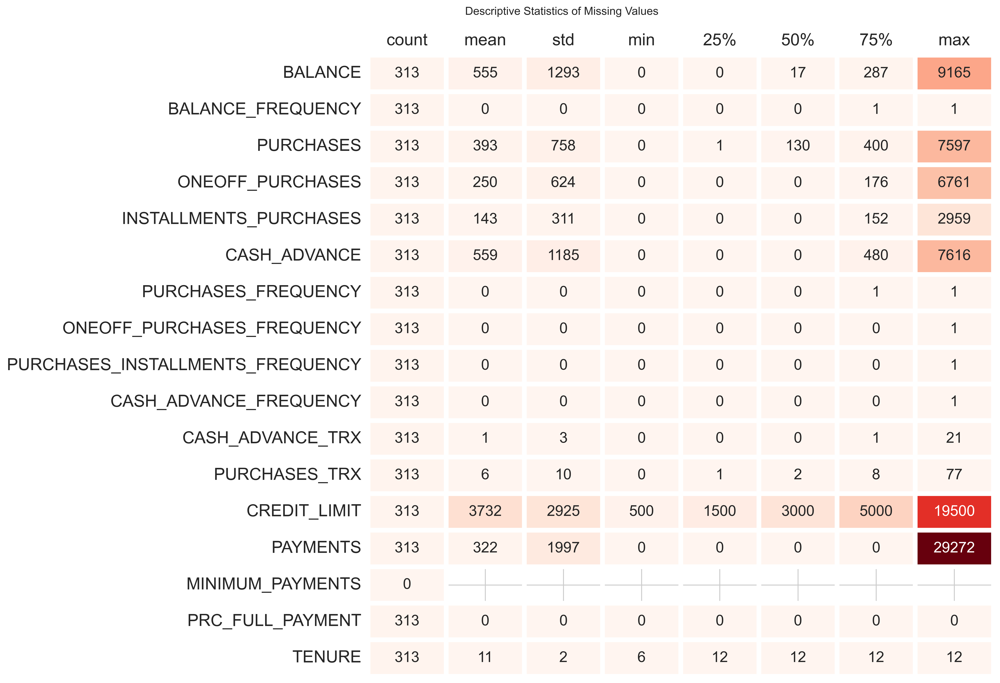

In [58]:
# Show detaile of datapoint with missing values
desc_cust = df[df.MINIMUM_PAYMENTS.isna()].describe().T

desc_cust_df = pd.DataFrame(index=desc_cust.index, columns=desc_cust.columns, data=desc_cust )

f,ax = plt.subplots(figsize=(12,12),dpi=500)

sns.heatmap(desc_cust_df, annot=True,cmap = "Reds", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,
            annot_kws={"size": 16})

ax.xaxis.set_ticks_position('top')
plt.tick_params(left=False, top=False)
plt.xticks(size = 18)
plt.yticks(size = 18)

plt.title("Descriptive Statistics of Missing Values", pad=30, x=0.31, y=1.02)
plt.show()

### Exploratory Data Analysis (EDA)

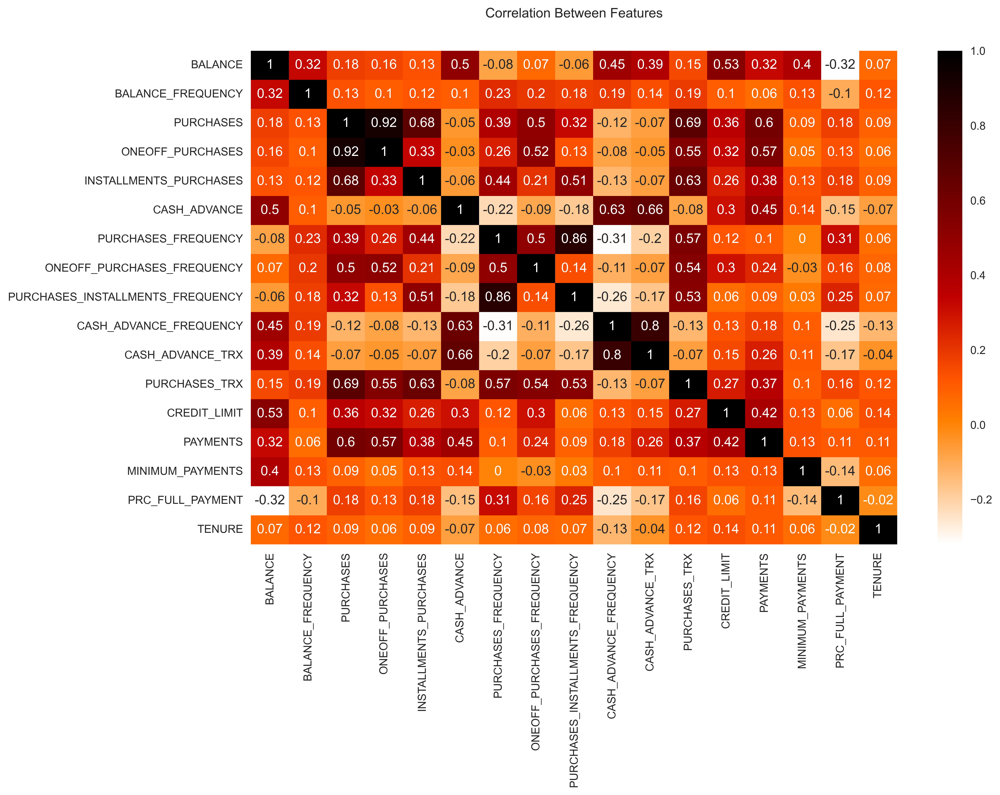

In [59]:
# Overview correlation between features
plt.figure(figsize=(13,8), dpi=500)
sns.heatmap(round(df.corr(),2), annot=True, cmap='gist_heat_r')
plt.title("Correlation Between Features", pad=30)
plt.show()

Since there is not much linear correlation between minimum_payments and other features, it is not possible to get the missing values from other features with the help of linear regression, so we use KNNimputer to fill the missing values.

In [60]:
# Fill the remaining missing values with KNNimputer()
# Define imputer
imputer = KNNImputer()
# Fit on the dataset
imputer.fit(df)
# Transform the dataset
df1 = pd.DataFrame(imputer.transform(df),columns=df.columns)

# Print result
print(f'Missing (before): {df.isna().sum().sum()}')
print(f'Missing (after): {df1.isna().sum().sum()}')   

Missing (before): 313
Missing (after): 0


In [61]:
# Check duplicated data
print(f"Number of dupilcated data: {df1.duplicated().sum()}" )

Number of dupilcated data: 0


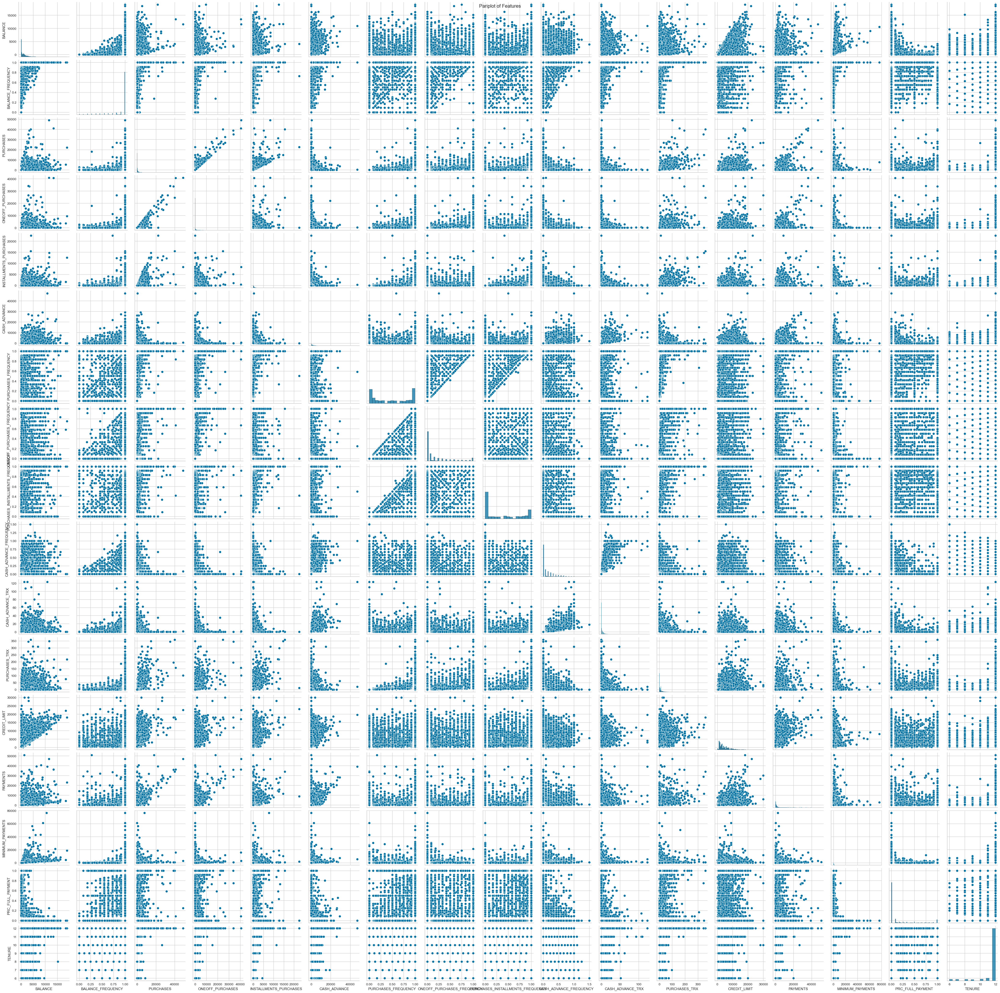

In [62]:
# Draw pair plot for check noise and
pplot = sns.pairplot(df1, palette="#B41B10")
pplot.fig.suptitle("Pariplot of Features")
pplot.tight_layout()
plt.show()

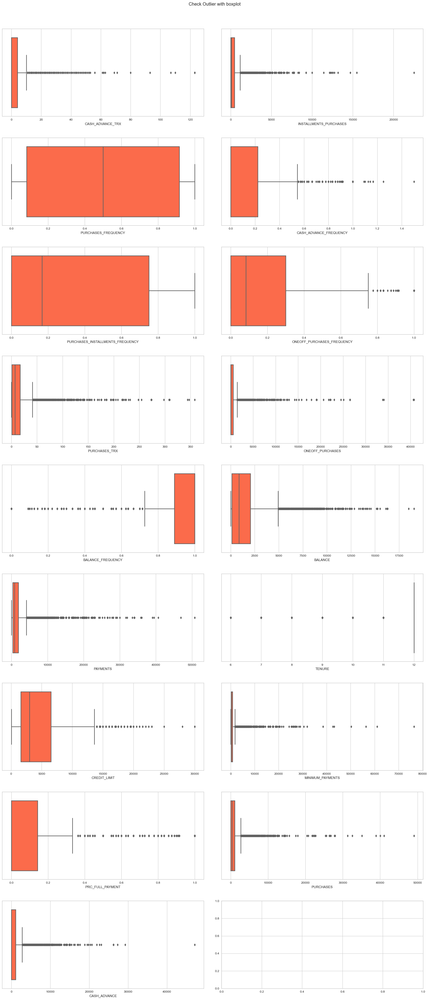

In [63]:
num_plots = len(set(df1.columns) - set(['tenure']))
fig, ax = plt.subplots((num_plots + 1) // 2, 2, figsize=(20, 5 * ((num_plots + 1) // 2)))

for i, col in enumerate(set(df1.columns) - set(['tenure'])):
    sns.boxplot(data=df1, x=col, palette="Reds_r", saturation=1, linewidth=2, ax=ax[i//2, i%2])

plt.suptitle("Check Outlier with boxplot", y=1)
plt.tight_layout(pad=3.0)
plt.show()


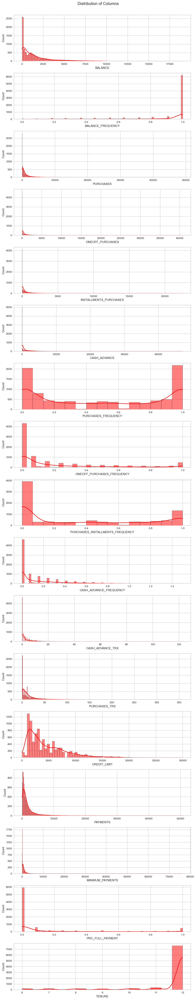

In [64]:
# Check distribution of features
fig, ax = plt.subplots(17, 1, figsize=(10,50))
for i, col in enumerate(df1):
    sns.histplot(df1[col], kde=True, ax=ax[i], color='red')
    
fig.suptitle('Distribution of Columns',y=1.002)
fig.tight_layout()
plt.show()

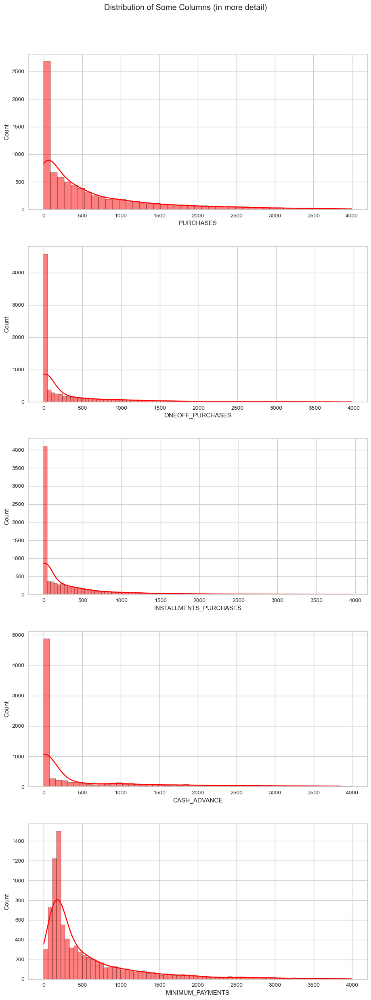

In [65]:
# Check distribution of some features in more detail
cols = ['PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'MINIMUM_PAYMENTS']
fig, ax = plt.subplots(5, 1, figsize=(10,25))
for i, col in enumerate(cols):
    sns.histplot(df1[df1 < 4000][col], kde=True, ax=ax[i], color='red')
    
fig.suptitle('Distribution of Some Columns (in more detail)',y=1.002)
fig.tight_layout(pad=3)
plt.show()

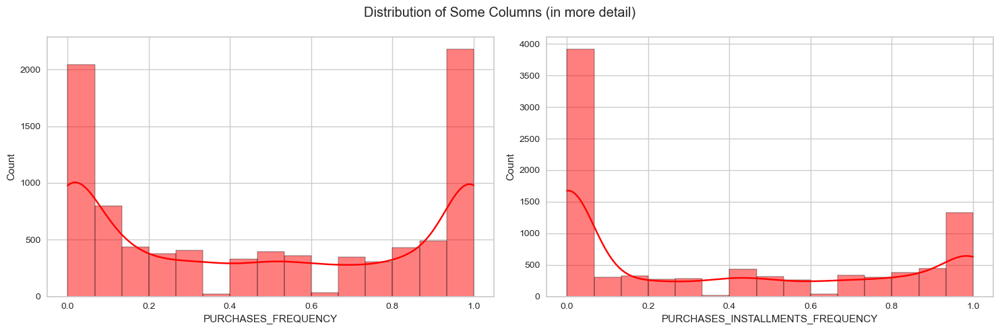

In [66]:
# Check distribution of purchases_frequency and purchases_installment_frequency in more detail
fig, ax = plt.subplots(1,2,figsize=(15,5), dpi=100)
for i,col in enumerate(['PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY']):
    sns.histplot(df1[col], kde=True, color='red', ax=ax[i])

fig.suptitle('Distribution of Some Columns (in more detail)')
fig.tight_layout()
plt.show()

- 👉 The purchases_frequency distribution has two peaks, one at zero (left side of the plot) and one at one (right side of the plot). Therefore, based on this feature, the data can be divided into two clusters:
customers with low purchases_frequency
customers with high purchases_frequency
- 👉 The purchases_installments_frequency distribution also has two peaks, one at zero (left side of the plot) and one at one (right side of the plot). Therefore, based on this feature, the data can be divided into two clusters:
customers with low purchases_installments_frequency
customers with high purchases_installments_frequency

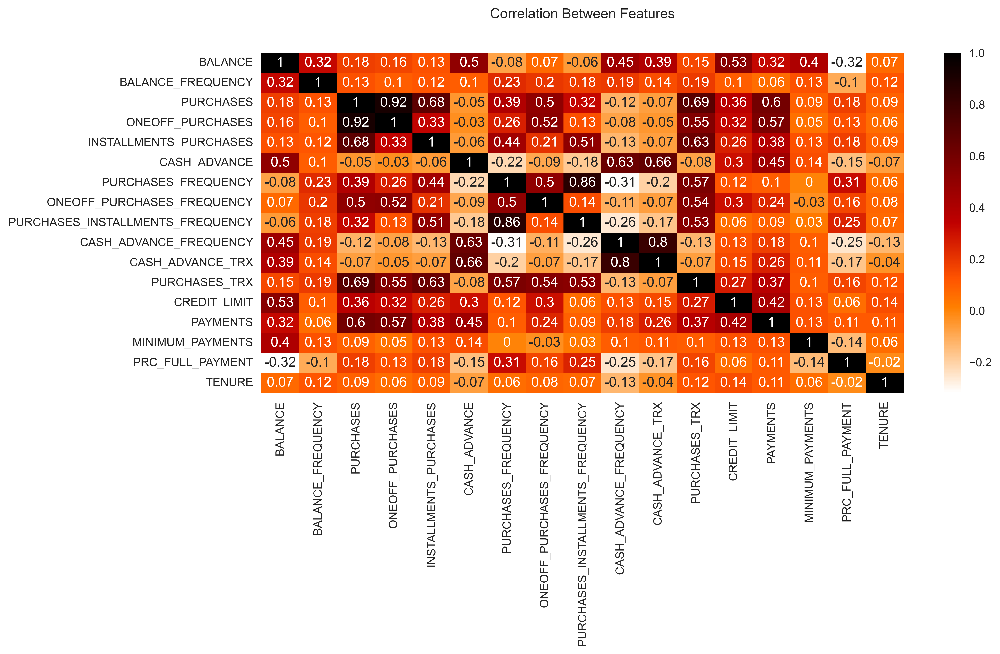

In [67]:
# Correlation between features
plt.figure(figsize=(13,8), dpi=500)
sns.heatmap(round(df.corr(),2), annot=True, cmap='gist_heat_r')
plt.title("Correlation Between Features", pad=30)
plt.tight_layout()
plt.show()

👉 As can be seen, each customer's balance is more correlated with cash_advance and credit_limit. Also, the purchases of each customer have the highest correlation with oneoff_purchases, purchases_trx, installments_purchases and payments.

### Scale the data

In [68]:
# Standardize dataset
scaler = StandardScaler().fit(df1)
df_trans = scaler.transform(df1)
df2 = pd.DataFrame(df_trans, columns = df1.columns)
df2

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-0.303869,-0.525588,0.360541
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,0.093483,0.234159,0.360541
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-0.096095,-0.525588,0.360541
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,-0.201502,-0.525588,0.360541
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-0.259023,-0.525588,0.360541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,-0.738015,0.517980,-0.333331,-0.356957,-0.132688,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.486266,-0.342472,1.183844,-4.126919
8945,-0.742488,0.517980,-0.329174,-0.356957,-0.122869,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.503445,-0.296819,-0.525588,-4.126919
8946,-0.740463,-0.185895,-0.402000,-0.356957,-0.294930,-0.466805,0.854463,-0.678716,0.760359,-0.675294,-0.476083,-0.390691,-0.960380,-0.570660,-0.328188,0.329128,-4.126919
8947,-0.745239,-0.185895,-0.469584,-0.356957,-0.454607,-0.449373,-1.221928,-0.678716,-0.917090,0.157536,-0.183026,-0.591841,-1.097795,-0.580581,-0.339546,0.329128,-4.126919


## DBSCAN Clustering

Text(0.5, 1.0, 'K-Distance Graph')

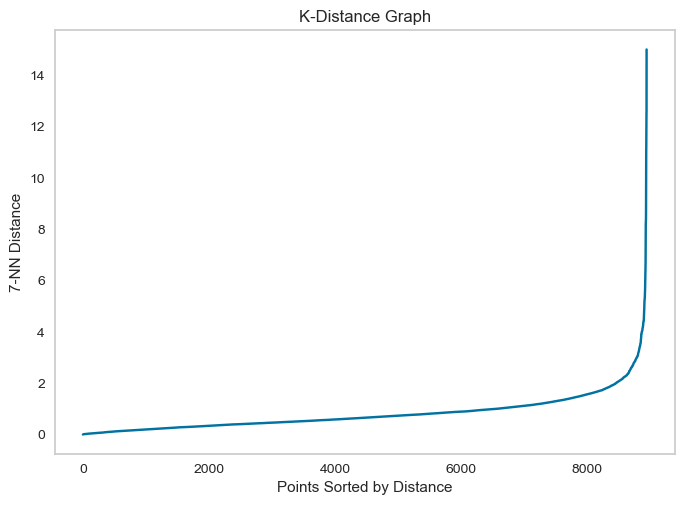

In [69]:
# Using NearestNeighbors fucntion for to guess the right value for eps
knn = NearestNeighbors(n_neighbors = 4)
model = knn.fit(df2)
distances, indices = knn.kneighbors(df2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.grid()
plt.plot(distances);
plt.xlabel('Points Sorted by Distance')
plt.ylabel('7-NN Distance')
plt.title('K-Distance Graph')

In [70]:
# Finding best value for eps and min_sample
eps_values = np.arange(1,15,2) # eps values to be investigated
min_samples = np.arange(20,41,10) # min_samples values to be investigated

DBSCAN_params = list(product(eps_values, min_samples))

Because DBSCAN creates clusters itself based on those two parameters let's check the number of generated clusters and evaluate reuslts by silhouette and calinski coefficient to tuning eps and min_samples.

In [71]:
# Check optimom n_clusters for implement birch by using silhouette and calinski coefficient
silhouette_coef = []
num_of_clusters = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df2)
    score = silhouette_score(df2, dbscan.labels_)
    silhouette_coef.append(score)
    # for check number of clusters
    num_of_clusters.append(len(np.unique(dbscan.labels_)))

calinski_harabasz_coef = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df2)
    score = calinski_harabasz_score(df2, dbscan.labels_)
    calinski_harabasz_coef.append(score)

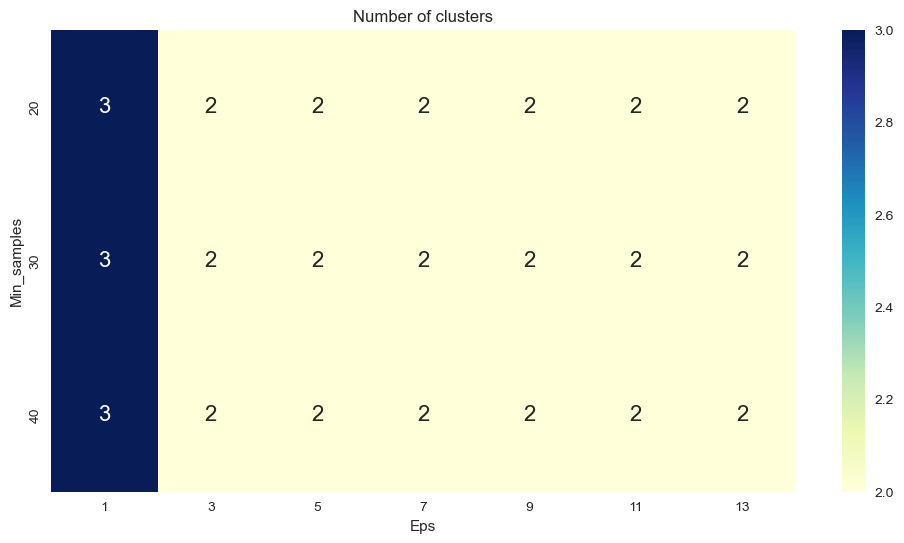

In [72]:
# Check cluster results by heatmap
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['No_of_clusters'] = num_of_clusters

pivot_1 = pd.pivot_table(tmp, values='No_of_clusters', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(pivot_1, annot=True,annot_kws={"size": 16}, cmap="YlGnBu", ax=ax)
ax.set_title('Number of clusters')
plt.show()

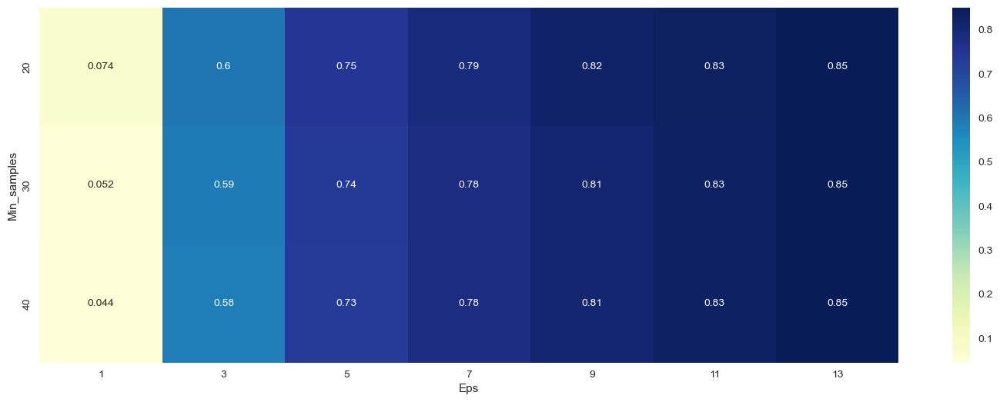

In [73]:
# Check silhouette score by heatmap
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['Sil_score'] = silhouette_coef

pivot_1 = pd.pivot_table(tmp, values='Sil_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()

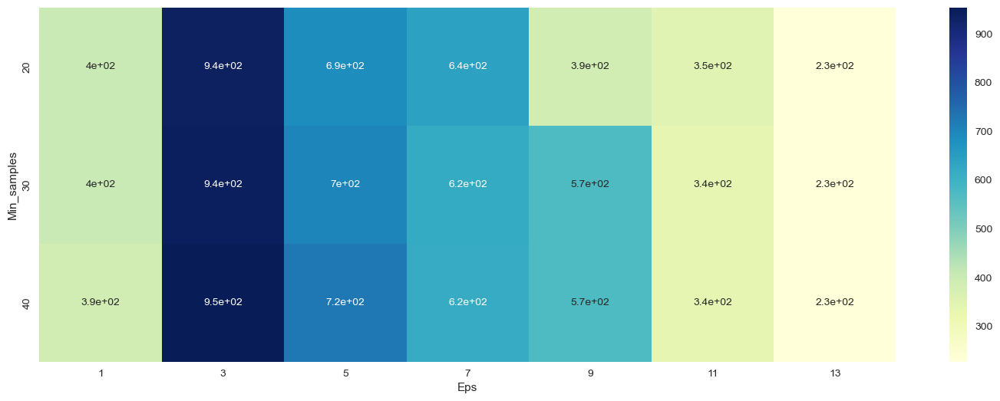

In [74]:
# Check Calinski score by heatmap
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['CH_score'] = calinski_harabasz_coef

pivot_1 = pd.pivot_table(tmp, values='CH_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()

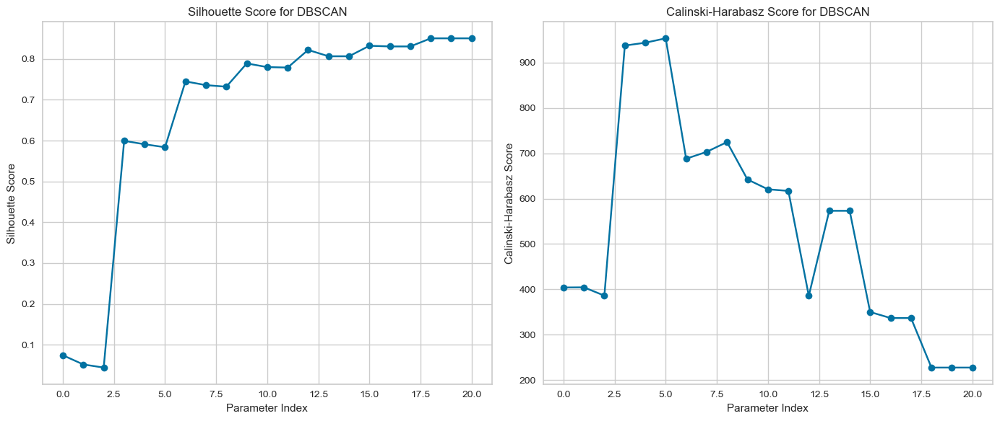

In [75]:
import matplotlib.pyplot as plt

def plot_evaluation(silhouette_scores, calinski_harabasz_scores, model_name, x):
    plt.figure(figsize=(14, 6))

    # Plot Silhouette Score
    plt.subplot(1, 2, 1)
    plt.plot(x, silhouette_scores, marker='o')
    plt.title(f'Silhouette Score for {model_name}')
    plt.xlabel('Parameter Index')
    plt.ylabel('Silhouette Score')

    # Plot Calinski-Harabasz Score
    plt.subplot(1, 2, 2)
    plt.plot(x, calinski_harabasz_scores, marker='o')
    plt.title(f'Calinski-Harabasz Score for {model_name}')
    plt.xlabel('Parameter Index')
    plt.ylabel('Calinski-Harabasz Score')

    plt.tight_layout()
    plt.show()

# Example usage
plot_evaluation(silhouette_coef, calinski_harabasz_coef, 'DBSCAN', x=range(len(DBSCAN_params)))


In [76]:
# Coordinates of point in above table
for i in enumerate(DBSCAN_params):
    print(i)

(0, (1, 20))
(1, (1, 30))
(2, (1, 40))
(3, (3, 20))
(4, (3, 30))
(5, (3, 40))
(6, (5, 20))
(7, (5, 30))
(8, (5, 40))
(9, (7, 20))
(10, (7, 30))
(11, (7, 40))
(12, (9, 20))
(13, (9, 30))
(14, (9, 40))
(15, (11, 20))
(16, (11, 30))
(17, (11, 40))
(18, (13, 20))
(19, (13, 30))
(20, (13, 40))


According to the above results, we consider eps=3.5 and min_samples=40 and implement the DBSCAN algorithm.

In [77]:
# Implement DBSCAN for best eps and min_sample obtained from above
dbscan = DBSCAN(eps=3.5, min_samples=40)
dbscan.fit(df2)
# Store result of DBSCAN
pred = dbscan.labels_
# Number of cluster
num_of_clusters = len(np.unique(pred))
# Evaluate results of mean shift by silhouette and calinski coefficient
sh_score = silhouette_score(df2, pred)
ch_score = calinski_harabasz_score(df2, pred)
# Print results
print(f"Number of cluster: {np.unique(pred)}")
print(f"Silhouette Coefficient: {sh_score:.2f}")
print(f"Calinski Harabasz Coefficient: {ch_score:.2f}")

Number of cluster: [-1  0]
Silhouette Coefficient: 0.63
Calinski Harabasz Coefficient: 894.06


In [78]:
best_model = pd.DataFrame(columns=['Model', 'Silhouette Score', 'Calinski-Harabasz Score', 'Parameters'])

# Example data
# df2 = ...  # Your dataset
# pred = ...  # Your DBSCAN predictions

# Store results obtained from DBSCAN
best_model.loc[len(best_model.index)] = [
    "DBSCAN",
    silhouette_score(df2, pred),
    calinski_harabasz_score(df2, pred),
    {"eps": 3.5, "min_samples": 40}
]


In [79]:
# Adding the clusters column to the main dataframe (df2) and store in new dataframe
df_result_dbscan = pd.concat([df1, pd.DataFrame(pred, columns=['cluster'])], axis = 1)
df_result_dbscan

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0,0
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,379.829982,0.000000,12.0,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0,0
8945,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,156.060050,0.000000,6.0,0
8946,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0,0
8947,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2.0,0.0,500.0,52.549959,55.755628,0.250000,6.0,0


In [80]:


# Initialize DBSCAN with appropriate parameters
dbscan = DBSCAN(eps=3.5, min_samples=40)

# Fit the model
dbscan.fit(df2)

# Store result of DBSCAN
pred_dbscan = dbscan.labels_

# Number of clusters
num_of_clusters = len(np.unique(pred_dbscan))

# Print results
print(f"Number of clusters: {num_of_clusters}")

# Store results in DataFrame
best_model = pd.DataFrame(columns=['Model', 'Silhouette Score', 'Calinski-Harabasz Score', 'Parameters'])
best_model.loc[len(best_model.index)] = [
    "DBSCAN",
    silhouette_score(df2, pred_dbscan),
    calinski_harabasz_score(df2, pred_dbscan),
    {"eps": 3.5, "min_samples": 40}
]

print(best_model)


Number of clusters: 2
    Model  Silhouette Score  Calinski-Harabasz Score  \
0  DBSCAN          0.630633               894.056713   

                        Parameters  
0  {'eps': 3.5, 'min_samples': 40}  


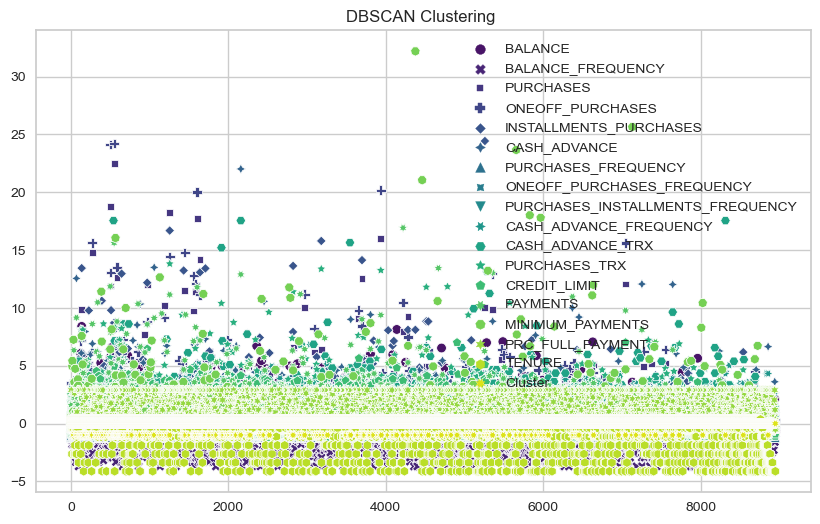

In [81]:

df3=df2
# Add the cluster labels to the DataFrame
df3['Cluster'] = dbscan.labels_

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df3, palette='viridis')
plt.title('DBSCAN Clustering ')
plt.show()


In [101]:
df2.drop(columns='Cluster',inplace=True)

## PCA (Principal Component Analysis)

In [103]:

# Perform PCA
pca = PCA(n_components=2)  # You can choose the number of components
principal_components = pca.fit_transform(df2)

# Create a DataFrame with the principal components
df2_pca = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Add the principal components to the original DataFrame
pca_df2 = pd.concat([df2, df2_pca], axis=1)

print(pca_df2.head())

    BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
0 -0.732054          -0.249881  -0.424934         -0.356957   
1  0.786858           0.134049  -0.469584         -0.356957   
2  0.447041           0.517980  -0.107716          0.108843   
3  0.049015          -1.017743   0.231995          0.546123   
4 -0.358849           0.517980  -0.462095         -0.347317   

   INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
0               -0.349114     -0.466805            -0.806649   
1               -0.454607      2.605438            -1.221928   
2               -0.454607     -0.466805             1.269742   
3               -0.454607     -0.368678            -1.014290   
4               -0.454607     -0.466805            -1.014290   

   ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  \
0                   -0.678716                         -0.707409   
1                   -0.678716                         -0.917090   
2                    2.673295      

In [104]:
pca.components_

array([[ 0.10163928,  0.12044424,  0.41160618,  0.34638033,  0.33677608,
        -0.02291795,  0.32126223,  0.29453468,  0.2745094 , -0.08863246,
        -0.04823449,  0.39063683,  0.21186194,  0.26641828,  0.06269469,
         0.13185785,  0.08089547],
       [ 0.40396391,  0.13184776,  0.04009252,  0.06196546, -0.01910319,
         0.43883271, -0.19102552, -0.01847267, -0.17875303,  0.43403803,
         0.41946658, -0.02005172,  0.23790675,  0.2565127 ,  0.17017772,
        -0.19010034, -0.00426743]])

In [105]:
# Variance Ratio

pca.explained_variance_ratio_

array([0.27293686, 0.20320092])

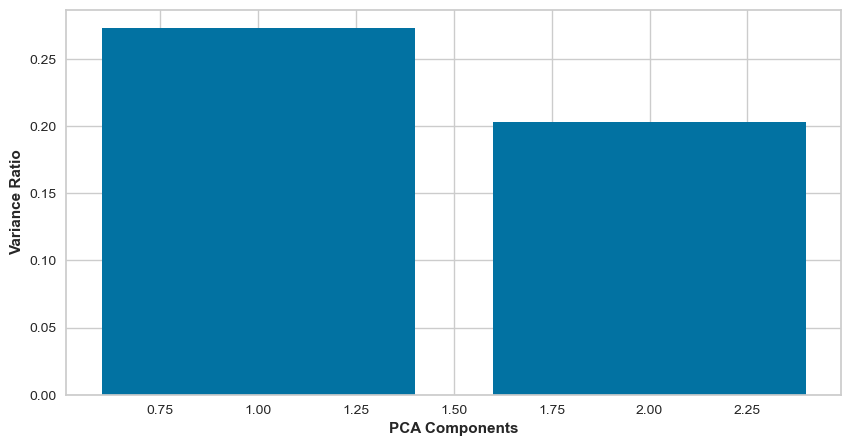

In [106]:
# Variance Ratio bar plot for each PCA components.
plt.figure(figsize = (10, 5))
ax = plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.xlabel("PCA Components",fontweight = 'bold')
plt.ylabel("Variance Ratio",fontweight = 'bold')

plt.show()

In [107]:
# Check the column names
print(pca_df2.columns)

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE', 'PC1', 'PC2'],
      dtype='object')


Text(0.5, 1.0, 'PC1 vs PC2')

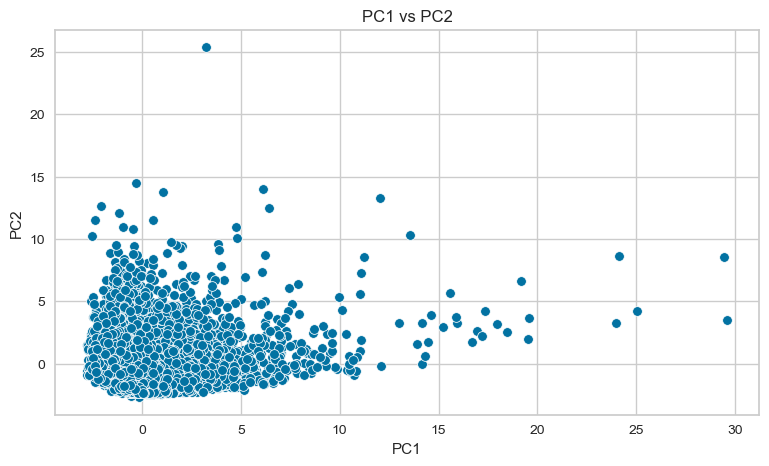

In [108]:
plt.figure(figsize=(20, 5))

# Plot PC1 vs PC2
plt.subplot(1, 2, 1)
sns.scatterplot(data=pca_df2, x='PC1', y='PC2')
plt.title('PC1 vs PC2')


## DBSCAN Clustering on PCA-Transformed Data'

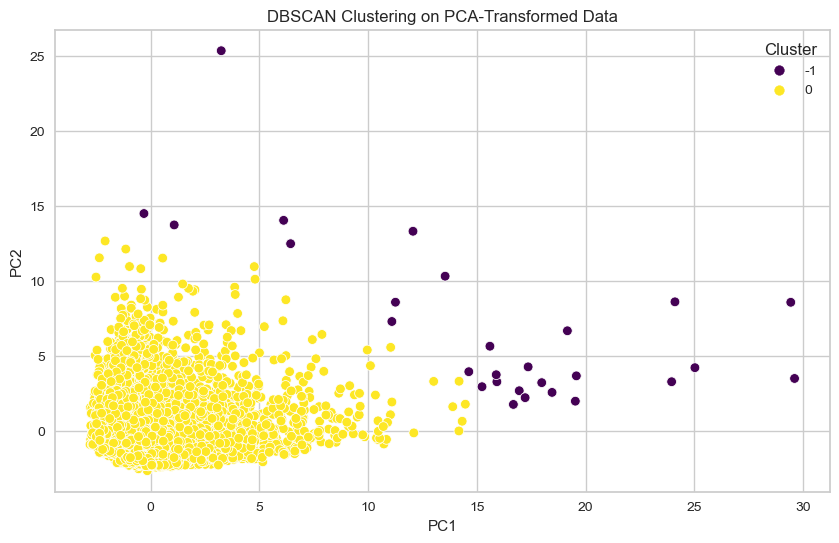

In [109]:
dbscan__ = DBSCAN(eps=3.5, min_samples=40)
dbscan__.fit(principal_components)

# Add the cluster labels to the DataFrame
pca_df2['Cluster'] = dbscan__.labels_

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df2, x='PC1', y='PC2', hue='Cluster', palette='viridis')
plt.title('DBSCAN Clustering on PCA-Transformed Data')
plt.show()


### Clustering Result

- Cluster -1: Customers with average balance and low credit_limit that frequently purchase
- Cluster 0: Cutomers with low balance and low credit limit that they are not frequently purchase in type of oneoff or installment.